<a href="https://colab.research.google.com/github/positmin/positmin/blob/main/01_opencv_image_20221026.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
## 09:50
!apt install python3-opencv

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following package was automatically installed and is no longer required:
  libnvidia-common-460
Use 'apt autoremove' to remove it.
The following additional packages will be installed:
  python3-numpy
Suggested packages:
  python-numpy-doc python3-nose python3-numpy-dbg
The following NEW packages will be installed:
  python3-numpy python3-opencv
0 upgraded, 2 newly installed, 0 to remove and 27 not upgraded.
Need to get 2,477 kB of archives.
After this operation, 13.9 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/main amd64 python3-numpy amd64 1:1.13.3-2ubuntu1 [1,943 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic-updates/universe amd64 python3-opencv amd64 3.2.0+dfsg-4ubuntu0.1 [534 kB]
Fetched 2,477 kB in 1s (2,114 kB/s)
Selecting previously unselected package python3-numpy.
(Reading database ... 123942 files and directories currently install

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [239]:
import cv2;
print(cv2.__version__)

4.6.0


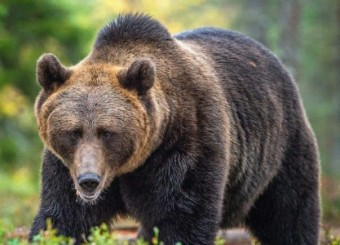

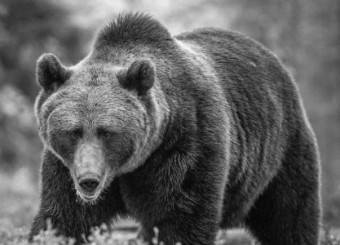

In [240]:
# windows / web
from google.colab.patches import cv2_imshow
import sys
import numpy as np
import cv2
fname = '/content/drive/MyDrive/gom.jpg'
src = cv2.imread('/content/drive/MyDrive/gom.jpg')
original = cv2.imread(fname, cv2.IMREAD_COLOR)
gray = cv2.imread(fname, cv2.IMREAD_GRAYSCALE)
if src is None:
  print('Image load failed!')
  sys.exit()
cv2_imshow(src)
cv2_imshow(gray)

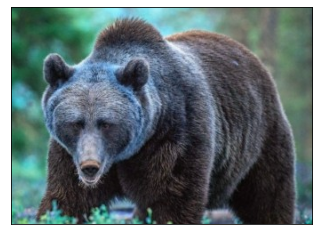

In [ ]:
from matplotlib import pyplot as plt
image = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)
plt.imshow(src)
plt.xticks([])
plt.yticks([])
plt.show()

[37 69 50]


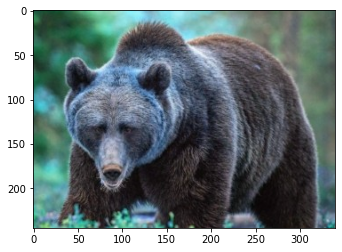

[50 69 37]


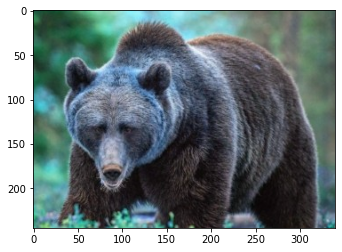

In [ ]:
# Read back the image
src=cv2.imread("/content/drive/MyDrive/gom.jpg", cv2.IMREAD_COLOR)
# Check the desired value = B
print(src[10,10])
plt.imshow(src)
plt.show()
# Convert the image
image = cv2.cvtColor(src, cv2.COLOR_BGR2RGB)
# Check the desired value = C
print(image[10, 10])
plt.imshow(src)
plt.show()

In [ ]:
from PIL import Image
import glob, os

size = 128, 128
# /content/drive/MyDrive/data/구글 이미지/1.thumbnail
for infile in glob.glob("/content/drive/MyDrive/*.jpg"):
  file, ext = os.path.splitext(infile)
  with Image.open(infile) as im:
    if im.mode != 'RGB':
      im = im.convert('RGB')
    im.thumbnail(size) # 요약이미지
    im.save(file + ".jpeg", "JPEG")
    im.show()

In [ ]:
## matplotlib을 이용해서 애니메이션을 만들어 보겠습니다
## 10:21
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
points = [(0.1, 0.5), (0.5, 0.5), (0.9, 0.5)]
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(5,5)
## 10:28 # 프레임을 받는 매개변수를 가진 함수
def animate(i): # 애니메이션 함수(매개변수로 변화된 값을 받아서 도형을 출력)
  ax.clear()
  point = points[i]
  ax.plot(point[0], point[1], color='green',
          label='original', marker='o')
  ax.set_xlim([0, 1])
  ax.set_ylim([0, 1])
# 0.5초, 1초는 1000ms
ani = FuncAnimation(fig, animate, frames=len(points),
                    interval=500, repeat=False)
plt.close()

In [ ]:
# gif 애니메이션 ## 만들어 봤었죠?
from matplotlib.animation import PillowWriter
ani.save("simple_animation.gif", dpi=300, writer=PillowWriter(fps=1))

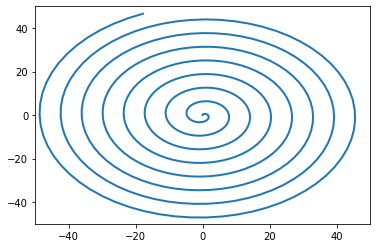

In [ ]:
import matplotlib.animation as animation
fig = plt.figure()
axis = plt.axes(xlim = (-50, 50),
              ylim = (-50, 50))
line, = axis.plot([], [], lw = 2)
def init():
  line.set_data([], [])
  return line,
xdata, ydata = [], []
def animate(i):
  t = 0.1 * i
  x = t * np.sin(t)
  y = t * np.cos(t)
  xdata.append(x)
  ydata.append(y)
  line.set_data(xdata, ydata)
  return line,
anim = animation.FuncAnimation(fig, animate, init_func = init,
                    frames = 500, interval = 20, blit = True)
anim.save('growingCoil.mp4', writer = 'ffmpeg', fps = 30)

In [ ]:
# 순서적으로 점을 찍어 갈 수 있도록 animation시켜 보시오.

In [ ]:
point_list = [(0,3), (1,0), (2,1), (3, 2), (5, 3),
              (7,4), (8,4), (10,3), (11,1), (12,1),
              (15,2), (17, 3), (18, 3), (20, 2)]
## 정답
x=[]
y=[]
for data in point_list:
  x.append(data[0])
  y.append(data[1])
print(x)
print(y)
data = {'x':x, 'y':y}
import pandas as pd
df = pd.DataFrame(data)
df

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
fig, ax = plt.subplots(1,1)
fig.set_size_inches(5,5)
# 프레임을 받는 매개변수를 가진 함수
def animate(i): # 애니메이션 함수(매개변수로 변화된 값을 받아서 도형을 출력)
  ax.clear()
  point = df[:i]
  ax.plot(point.x, point.y, color='green', label='original', marker='o')
  ax.set_xlim([0, 20])
  ax.set_ylim([0, 5])
# 0.5초, 1초는 1000ms
ani = FuncAnimation(fig, animate, frames=len(point_list),
                    interval=500, repeat=False)
plt.close()

In [ ]:
## 또 다른 방법

In [ ]:
from matplotlib.animation import PillowWriter
ani.save("simple_animation.gif", dpi=300, writer=PillowWriter(fps=1))

In [ ]:
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
point_list = [(0,3), (1,0), (2,1), (3, 2), (5, 3),
              (7,4), (8,4), (10,3), (11,1), (12,1),
              (15,2), (17, 3), (18, 3), (20, 2)]

fig, ax = plt.subplots(1,1)
fig.set_size_inches(5,5)
def animate(i): 
  ax.clear()
  point = point_list[:i]
  for j in point:
    ax.plot(j[0], j[1], color='green', label='original', marker='o')
  ax.set_xlim([0, 20])
  ax.set_ylim([0, 5])
# 0.5초 1초 1000ms
ani = FuncAnimation(fig, animate, frames=len(point_list),
                    interval=500, repeat=False)
plt.close()

In [ ]:
from matplotlib.animation import PillowWriter
ani.save("simple_animation.gif", dpi=300, writer=PillowWriter(fps=1))

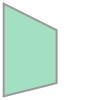

In [ ]:
from shapely.geometry import Polygon
p1 = Polygon(((1, 2), (5, 3), (5, 7), (1, 9), (1, 2)))
p1

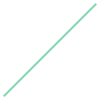

In [ ]:
## 11:25
from shapely.geometry import LineString
line = LineString([(0, 0), (10, 10)])
line

In [ ]:
## 11:32
print(p1.area)

22.0


In [ ]:
print(p1.bounds)

(1.0, 2.0, 5.0, 9.0)


In [ ]:
print(p1.length)

19.59524158061724


In [ ]:
print(p1.geom_type)

Polygon


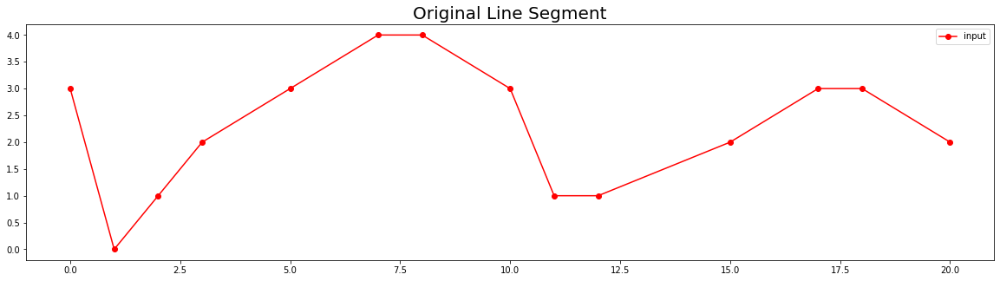

In [ ]:
import matplotlib.pyplot as plt
# GIS 용도의 모듈
from shapely.geometry import LineString

original = LineString(point_list)
fig, ax = plt.subplots(1, 1)
fig.set_size_inches(20, 5)
# * : 변동 리스트
# ** : 변동 dict
ax.plot(*original.xy, color='red',
        label='input', marker='o')
ax.set_title('Original Line Segment', fontsize=20)
ax.legend()
plt.savefig('line.png', bbox_inches='tight', dpi=300)
plt.show()

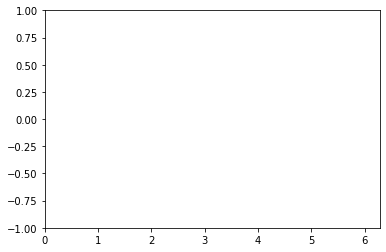

In [ ]:
## 11:38
fig, ax = plt.subplots()
xdata, ydata = [], []
ln, = ax.plot([], [], 'ro')

def init():
  ax.set_xlim(0, 2*np.pi)
  ax.set_ylim(-1, 1)
  return ln,

def update(frame):
  xdata.append(frame)
  ydata.append(np.sin(frame))
  ln.set_data(xdata, ydata)
  return ln,

ani = FuncAnimation(fig, update, frames=np.linspace(0, 2*np.pi, 128),
                    init_func=init, blit=True)

In [ ]:
# frame per second
ani.save("sin.gif",
         dpi=300, writer=PillowWriter(fps=1))

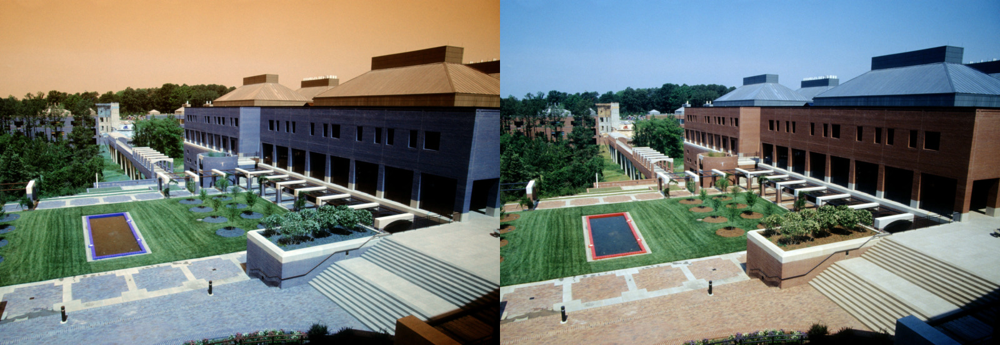

In [ ]:
## 11:45
from skimage import io
url = "https://iiif.lib.ncsu.edu/iiif/0052574/full/800,/0/default.jpg"
image = io.imread(url)
image_2 = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
final_frame = cv2.hconcat((image, image_2)) ## 2개의 데이터를 수평으로 합쳐라
cv2_imshow(final_frame) ## 이미지 합치기 ## opencv랑 같이 쓸때는 컬러를 신경써야한다

In [ ]:
print(image.dtype)
image.shape

uint8


(552, 800, 3)

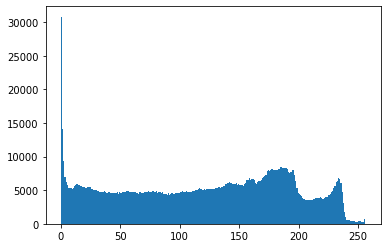

In [ ]:
## 11:51
plt.hist(image.ravel(),bins = 256, range=[0,256])
plt.show()

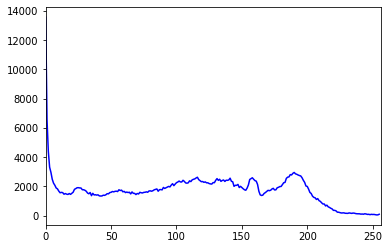

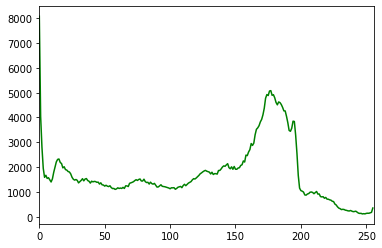

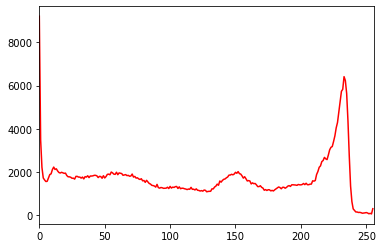

In [ ]:
color = ('b', 'g', 'r')
for i, col in enumerate(color):
  histr = cv2.calcHist([image],[i],None,[256],[0,256])
  plt.plot(histr, color = col)
  plt.xlim([0,256])
  plt.show()

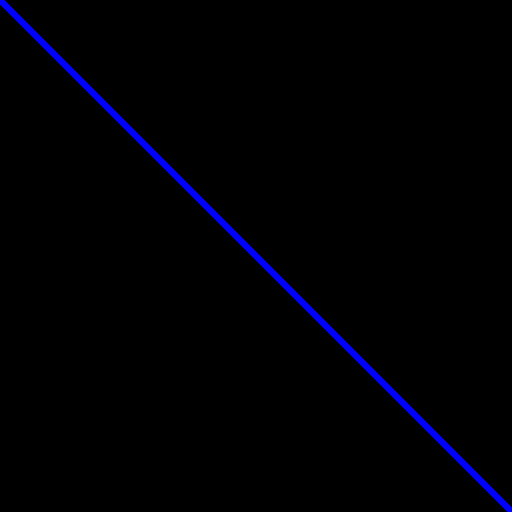

In [ ]:
## https://velog.io/@jumpx2/open-CV5-%EA%B7%B8%EB%A6%BC%EA%B7%B8%EB%A6%AC%EA%B8%B0
## 11:54
# 행과 열
img = np.zeros((512, 512, 3), np.uint8)
# opencv BGR(blue로 선을 그림)
img = cv2.line(img, (0, 0), (511, 511), (255, 0, 0), 5)

cv2_imshow(img)

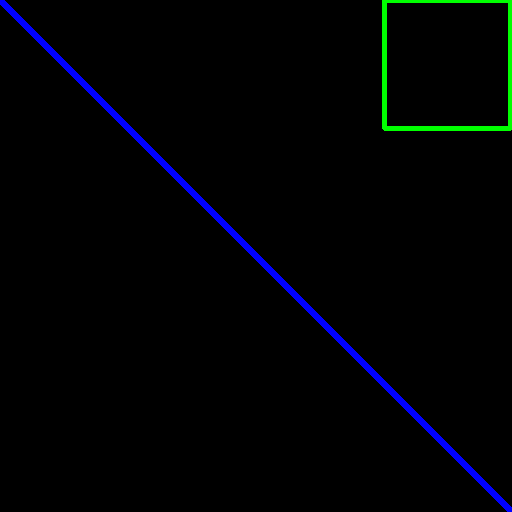

In [ ]:
img = cv2.rectangle(img, (384, 0), (510, 128), (0, 255, 0), 3)
cv2_imshow(img)

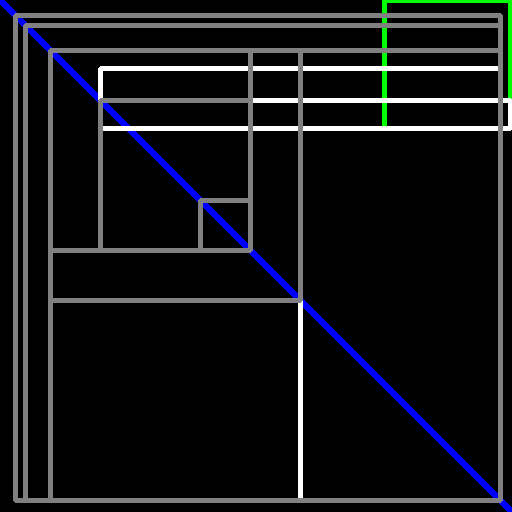

In [ ]:
img = cv2.rectangle(img, (500, 500), (15, 15), (128, 128, 128), 3)
cv2_imshow(img)

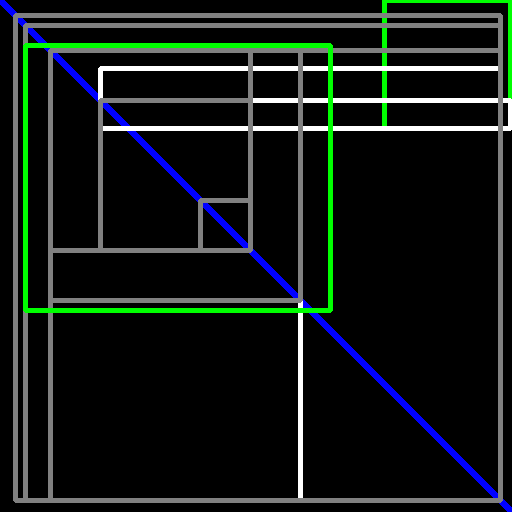

In [ ]:
cv2.rectangle(img,(25,45),(330,310),(0,255,0),3)
cv2_imshow(img)

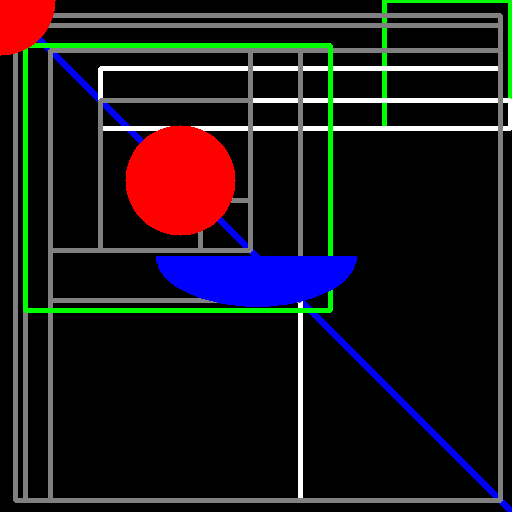

In [ ]:
# 내접원을 그리시오
cv2.circle(img,(180,180),55,(0,0,255),-1)
cv2_imshow(img)

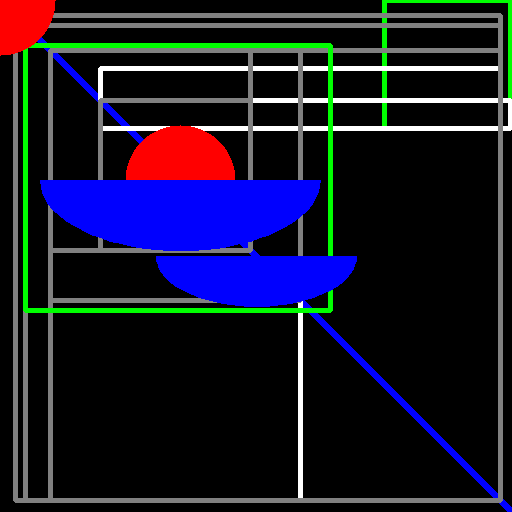

In [ ]:
## ellipse를 그리시오 ## 12:23
img = cv2.ellipse(img, (180, 180), (140, 70), 0, 0, 180, 255, -1)
cv2_imshow(img)

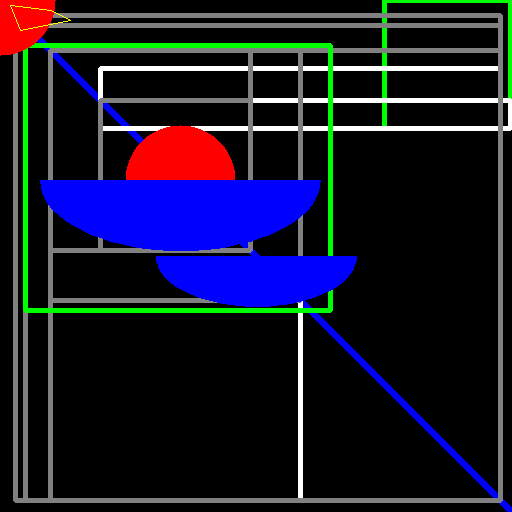

In [ ]:
## 12:28 ## polygon을 그려라
pts = np.array([[10, 5], [20, 30], [70, 20], [50, 10]], np.int32)
# 데이터를 3차원으로 제공
pts = pts.reshape((-1, 1, 2)) ## 가운데 1은 차원을 표시하는 것임
## reshape을 시켜줘야한다
# closed 시킬 것인가?
img = cv2.polylines(img, [pts], True, (0, 255, 255))
cv2_imshow(img)

In [ ]:
## https://opencv-python.readthedocs.io/en/latest/doc/03.drawShape/drawShape.html

In [ ]:
pts = np.array([[180, 45]])

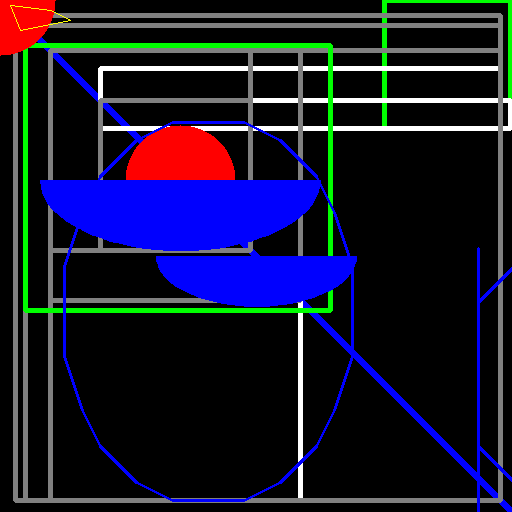

In [ ]:
cv2.putText(img, 'OpenCV', (10, 500), cv2.FONT_HERSHEY_SIMPLEX, 18, (255, 0, 0), 2)
cv2_imshow(img)

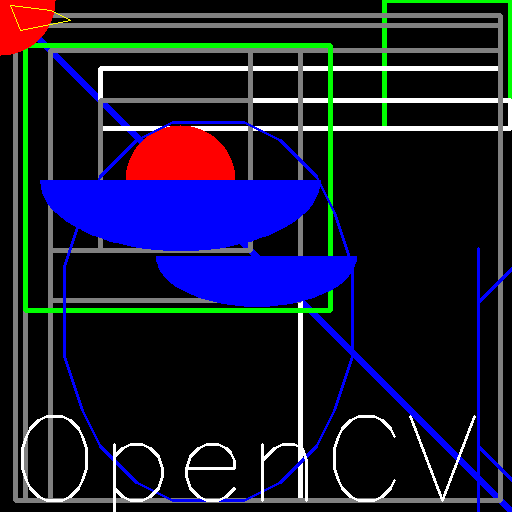

In [ ]:
cv2.putText(img, 'OpenCV', (10,500), cv2.FONT_HERSHEY_SIMPLEX, 4, (255,255,255), 2)
cv2_imshow(img)

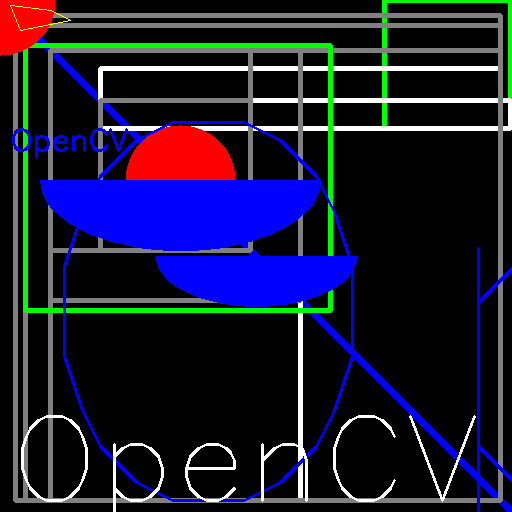

In [ ]:
cv2.putText(img, 'OpenCV', (10,150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255,0,0), 2)
cv2_imshow(img)

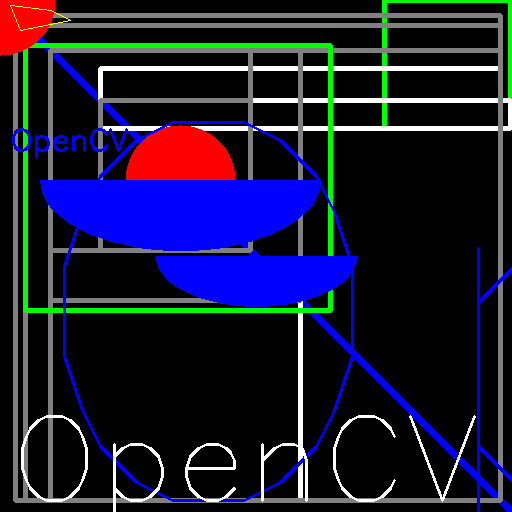

In [ ]:
cv2.putText(img, 'OpenCV', (10, 150), cv2.FONT_HERSHEY_SIMPLEX, 1, (255, 0, 0), 2)
cv2_imshow(img)

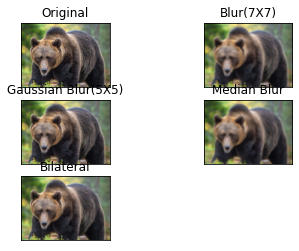

In [ ]:
## 12:43
# pyplot을 사용하기 위해 BGR을 RGB로 변환
fname = '/content/drive/MyDrive/gom.jpg'
img = cv2.imread(fname)
b, g, r = cv2.split(img)
img = cv2.merge([r,g,b])
# 일반 blur : 주변의 값을 고려해서 값을 재계산 - noise가 제고 - 색이 혼합
dst1 = cv2.blur(img, (7, 7))
# GaussianBlur
dst2 = cv2.GaussianBlur(img,(5, 5), 0)
# MedianBlur
dst3 = cv2.medianBlur(img, 9)
# Bilateral Filtering : 계산시간이 오래걸림, 픽셀 차이값도 고려, 거리값도 고려해서
# Edge를 고려한 값으로 
dst4 = cv2.bilateralFilter(img, 9, 75, 75)
images = [img, dst1, dst2, dst3, dst4]
titles = ['Original', 'Blur(7X7)', 'Gaussian Blur(5X5)', 'Median Blur', 'Bilateral']
for i in range(5):
  plt.subplot(3, 2, i+1),plt.imshow(images[i]),plt.title(titles[i])
  plt.xticks([]),plt.yticks([])
## 지금 이미지를 정확하게 넣어야 하는데 명령어 연습하고 있기 때문에 ## 12:51

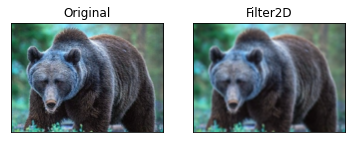

In [ ]:
img = cv2.imread(fname, 1)

kernel = np.ones((5, 5),np.float32)/25
dst = cv2.filter2D(img, -1, kernel) # convolution 연산을 이용한 필터링
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]), plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Filter2D')
plt.xticks([]), plt.yticks([])
plt.show()

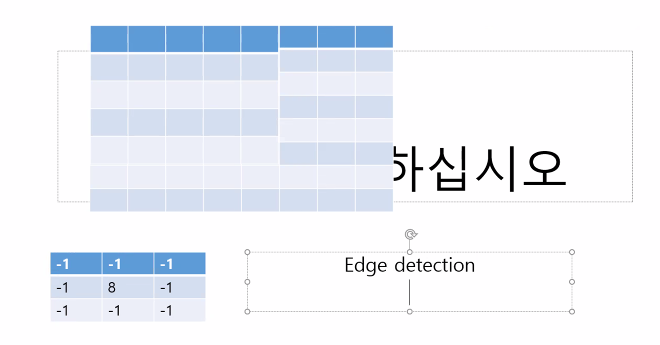

In [ ]:
## 12:57
# 문제 : edge detection matrix filter를 만들어서 convolution연산을 실행해 보시오

True

# identity convolution
## 14:10

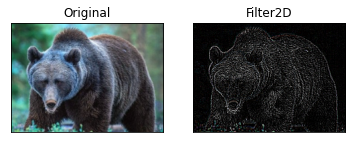

In [ ]:
# 문제 : edge detection matrix filter를 만들어서 convolution연산을 실행해 보시오
img = cv2.imread(fname,1)
kernel = np.array([[-1,-1,-1], [-1,8,-1],[-1,-1,-1]])
dst = cv2.filter2D(img, -1, kernel) # convolution 연산을 이용한 필터링 : same을 주고 실행
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]),plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Filter2D')
plt.xticks([]),plt.yticks([])
plt.show()
## 컨볼루션 연산하면 크기가 줄어듦

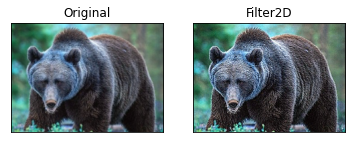

In [ ]:
img = cv2.imread(fname,1)
kernel = np.array([[0,-1,0], [-1,5,-1],[0,-1,0]])
dst = cv2.filter2D(img, -1, kernel) # convolution 연산을 이용한 필터링 : same을 주고 실행
plt.subplot(121),plt.imshow(img),plt.title('Original')
plt.xticks([]),plt.yticks([])
plt.subplot(122),plt.imshow(dst),plt.title('Filter2D')
plt.xticks([]),plt.yticks([])
plt.show()
## 컨볼루션 연산하면 크기가 줄어듦

In [ ]:
# 행렬 변환 ## 14:17

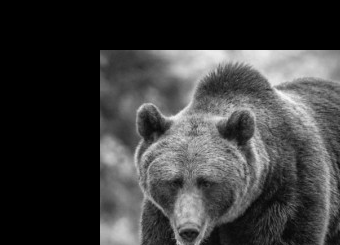

In [ ]:
import numpy as np
import cv2 as cv
img = cv2.imread(fname, 0)
rows,cols = img.shape
# [[1, 0, 100], ## x축으로 무브 # 3차원이면 3 x3 나와야 되죠? 2차원이면 2 x2가 와야되죠?
# [0, 1, 50]]
# 행렬의 대각선은 size와 관련이 있다
M = np.float32([[1, 0, 100], [0, 1, 50]])
# 보간법 : INTER_NEAREST, INTER_LINEAR, INTER_CUBIC, INTER_AREA, INTER_MAX
dst = cv.warpAffine(img, M, (cols, rows))
cv2_imshow(dst)

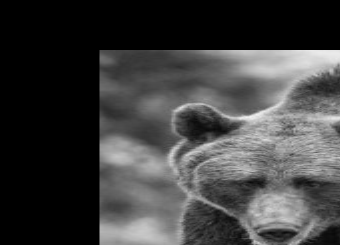

In [ ]:
M = np.float32([[2, 0, 100], [0, 1, 50]])
# 보간법 : INTER_NEAREST, INTER_LINEAR, INTER_CUBIC, INTER_AREA, INTER_MAX
dst = cv.warpAffine(img, M, (cols, rows))
cv2_imshow(dst)

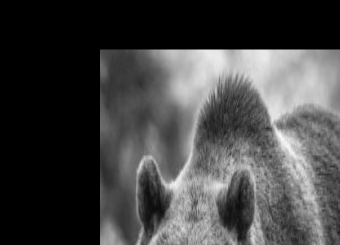

In [ ]:
M = np.float32([[1, 0, 100], [0, 2, 50]])
# 보간법 : INTER_NEAREST, INTER_LINEAR, INTER_CUBIC, INTER_AREA, INTER_MAX
dst = cv.warpAffine(img, M, (cols, rows))
cv2_imshow(dst)

In [ ]:
## 14:25
img = cv2.imread(fname, 0)
# None : outputarray
res = cv2.resize(img, None, fx=2, fy=2, interpolation = cv.INTER_CUBIC)

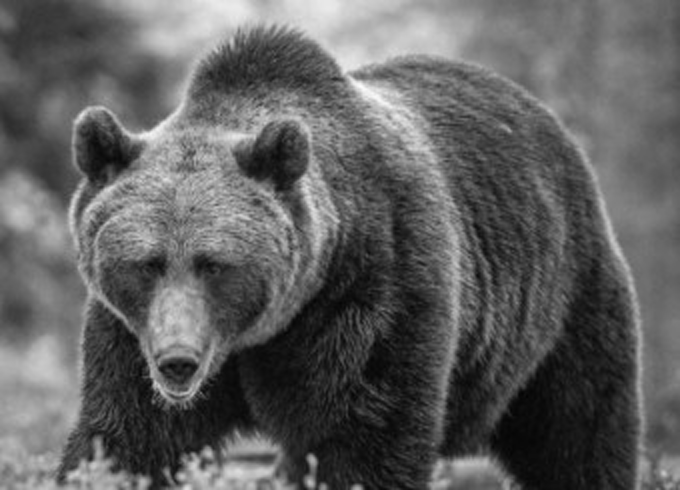

In [ ]:
cv2_imshow(res) ## 커졌죠?

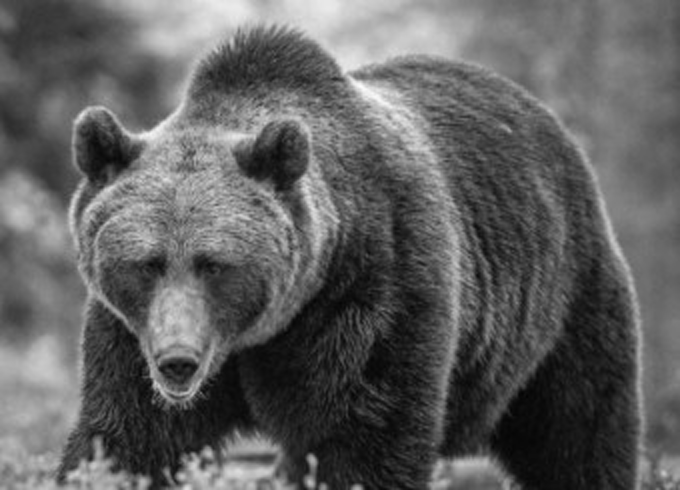

In [ ]:
height, width = img.shape[:2]
res = cv.resize(img,(2*width, 2*height), interpolation = cv.INTER_CUBIC)
cv2_imshow(res)

# 문제 : 이미지를 45도 회전시키시오

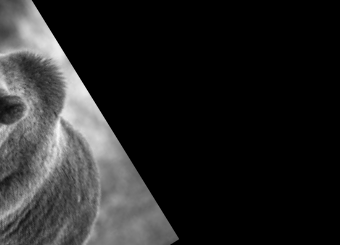

In [ ]:
## 14:38 ## 정답
# 좌상단을 중심으로하고 돌아간다
import math
img = cv2.imread(fname, 0)
M = np.float32([[math.cos(45),-math.sin(45),0],[math.sin(45),math.cos(45),-50]])
# 보간법 : INTER_NEAREST, INTER_LINEAR, INTER_CUBIC, INTER_AREA, INTER_MAX
dst = cv.warpAffine(img, M, (cols, rows))
cv2_imshow(dst)

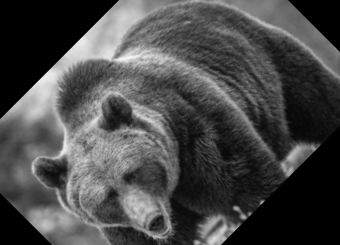

In [ ]:
# 원하는 지점을 중심으로 회전하도록 해준다.
rows,cols = img.shape
M = cv.getRotationMatrix2D(((cols-1)/2.0,(rows-1)/2.0), 45, 1)
dst = cv.warpAffine(img, M, (cols, rows))
cv2_imshow(dst)

(<matplotlib.axes._subplots.AxesSubplot at 0x7fc2ea1d0810>,
 Text(0.5, 1.0, 'Output'))

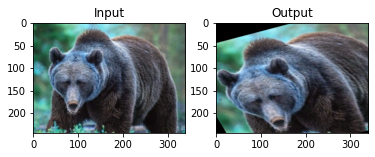

In [ ]:
## 14:46
img = cv2.imread(fname, 1)
rows, cols, ch = img.shape
pts1 = np.float32([[50, 50], [200, 50], [50, 200]])
pts2 = np.float32([[10, 100], [200, 50], [100, 250]])
M = cv.getAffineTransform(pts1, pts2) # 원래 이미지에서의 위치 -> 원하는 위치로 변환해주는 행렬을 만들어줌
dst = cv.warpAffine(img, M, (cols, rows))
plt.subplot(121), plt.imshow(img), plt.title('Input')
plt.subplot(122), plt.imshow(dst), plt.title('Output')

(<matplotlib.axes._subplots.AxesSubplot at 0x7fc2eaea8ed0>,
 Text(0.5, 1.0, 'Output'))

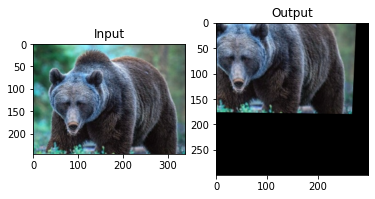

In [ ]:
# perspective view : 멀어지면 작아진다. : 원근감이 있도록 행렬을 조정
img = cv2.imread(fname, 1)
rows, cols, ch = img.shape
pts1 = np.float32([[50, 65], [368, 52], [28, 387], [389, 390]])
## 점이 4개가 있죠 이 위치로 갔다는 거죠
pts2 = np.float32([[0, 0], [300, 0], [0, 300], [300, 300]])
M = cv.getPerspectiveTransform(pts1, pts2) # 원래 이미지에서의 위치 -> 원하는 위치로 변환해주는 행렬을 만들어줌
dst = cv.warpPerspective(img, M, (300, 300))
plt.subplot(121), plt.imshow(img), plt.title('Input')
plt.subplot(122), plt.imshow(dst), plt.title('Output')

# 문제 pts1, pts2를 각 해당하는 이미지에 원으로 표현하고 어떤 변환을 했는지 확인해 보시오

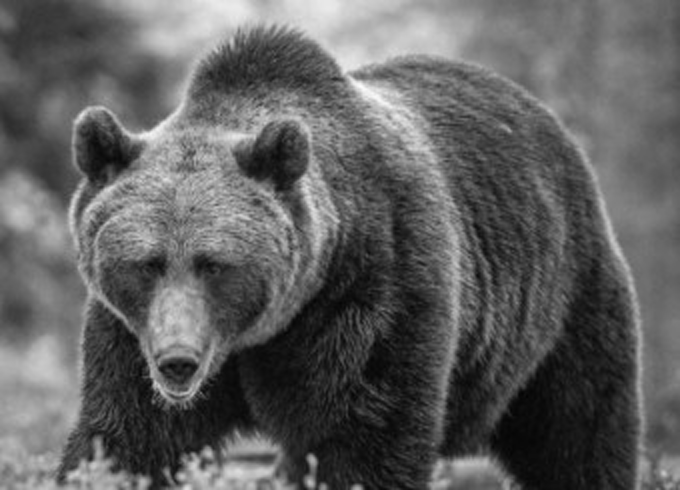

In [ ]:
cv2_imshow(res) ## 커졌죠?

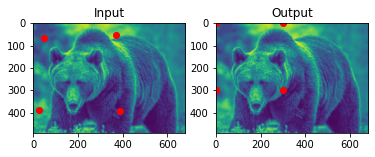

In [ ]:
## 15:10
# 범위를 벗어나서 3점이 안찍힘 => 이미지 큰 것으로 바꾸기
plt.subplot(121), plt.title('Input')
for pts in pts1:
  plt.plot(pts[0],pts[1], color='red', label = 'input', marker='o')
plt.imshow(res) ## img
plt.subplot(122), plt.title('Output')
for pts in pts2: ## img
  plt.plot(pts[0],pts[1], color='red', label = 'input', marker='o')
plt.imshow(res)

# shear(전단) : 층밀림

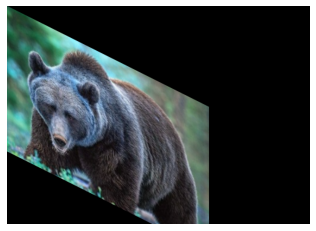

In [ ]:
M = np.float32([[1, 0.5, 0],
                [0, 1, 0],
                [0, 0, 1]])
M = np.float32([[1, 0, 0],
                [0.5, 1, 0],
                [0, 0, 1]])
sheared_img = cv2.warpPerspective(img, M, (int(cols*1.5), int(rows*1.5)))
plt.axis('off')
plt.imshow(sheared_img)

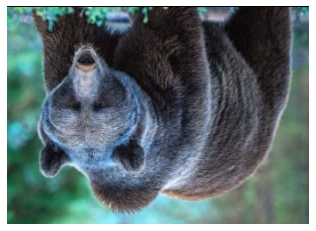

In [ ]:
rows, cols, dim = img.shape
M = np.float32([[1, 0, 0],
            [0, -1, rows],
            [0, 0, 1]])
#M = np.float32([[-1, 0, cols],
#            [0, 1, 0],
#            [0, 0, 1]])
reflected_img = cv2.warpPerspective(img, M, (int(cols), int(rows)))
plt.axis('off')
plt.imshow(reflected_img)
plt.imsave("city_reflected.jpg", reflected_img)

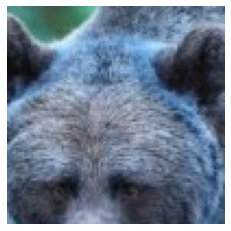

In [ ]:
cropped_img = img[50:150, 50:150]
plt.axis('off')
plt.imshow(cropped_img)
plt.show()

## 15:19
# 구글이미지 다운로드

In [ ]:
!pip install git+https://github.com/Joeclinton1/google-images-download.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/Joeclinton1/google-images-download.git to /tmp/pip-req-build-3s67t423
  Running command git clone -q https://github.com/Joeclinton1/google-images-download.git /tmp/pip-req-build-3s67t423
     |████████████████████████████████| 995 kB 5.1 MB/s 
     |████████████████████████████████| 384 kB 63.7 MB/s 
     |████████████████████████████████| 140 kB 59.9 MB/s 
     |████████████████████████████████| 58 kB 5.2 MB/s 
  Created wheel for google-images-download: filename=google_images_download-2.8.0-py2.py3-none-any.whl size=16299 sha256=678ef8490baee3592518fadeb0489c1910049be7f1a89ca1735797470d5606c3
  Stored in directory: /tmp/pip-ephem-wheel-cache-cp1fk6kn/wheels/79/5c/d2/2569a4f55ff29b3c4d6b1114d5110a70a79afbf381e6eb3e87
Successfully built google-images-download
  Attempting uninstall: urllib3
    Found existing installation: urllib3 1.24.3
    Uninstalling urlli

In [ ]:
!apt-get update
!apt install chromium-chromedriver
!cp /usr/lib/chromium-browser/chromedriver/usr/bin

Get:1 https://cloud.r-project.org/bin/linux/ubuntu bionic-cran40/ InRelease [3,626 B]
Ign:2 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64  InRelease
Hit:4 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1804/x86_64  Release
Hit:5 http://ppa.launchpad.net/c2d4u.team/c2d4u4.0+/ubuntu bionic InRelease
Hit:6 http://ppa.launchpad.net/cran/libgit2/ubuntu bionic InRelease
Get:7 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic InRelease [15.9 kB]
Hit:8 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease
Get:10 http://ppa.launchpad.net/deadsnakes/ppa/ubuntu bionic/main amd64 Packages [44.0 kB]
Get:11 http://security.ubuntu.com/ubuntu bionic-security InRelease [88.7 kB]
Get:12 http://security.ubuntu.com/ubuntu bionic-security/restricted amd64 Packages [1,210 kB]
Get:13 http://security.ubuntu.com/ubuntu bionic-securi

In [ ]:
!pip install selenium

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from google_images_download import google_images_download
response = google_images_download.googleimagesdownload()
arguments = {"keywords": "chickens",
                        "limit":100,
                        "print_urls":True,
                        "format":"jpg",
                        "chromedriver": r"/usr/bin/chromedriver.exe"
                              }
paths = response.download(arguments)
print(paths)

In [ ]:
!pip install mahotas

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 5.7 MB 4.9 MB/s 


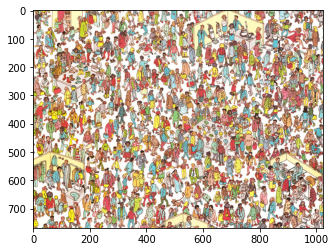

In [ ]:
from pylab import imshow, show
import mahotas
import mahotas.demos
import numpy as np

wally = mahotas.demos.load('wally')
imshow(wally)

In [ ]:
wfloat = wally.astype(float) # float형 이미지
# 채널 분리
r, g, b = wfloat.transpose((2, 0, 1)) # 전치 0, 1, 2
w = wfloat.mean(2)
# 이미지는 행열이 바뀌어 있음
pattern = np.ones((24, 16), float)
for i in range(2):
  pattern[i::4] = -1 # 줄무늬 패턴을 생성 ## :: -> 4씩 주라는 뜻
# 컨볼루션 연산
# +, -가 있는 이미지로 만들고 패턴을 적용 
v = mahotas.convolve(r-w, pattern) # 한 칸씩 이동하면서 컨볼루션 연산

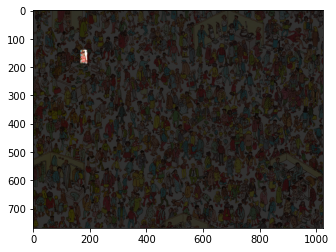

In [ ]:
mask = (v == v.max()) # 제일 큰 값: 컨볼루션 연산을 하면 패턴이 일치하면 큰 값이 될 것이다.
# 경계선을 형성
mask = mahotas.dilate(mask, np.ones((48, 24))) # 이미지보다 사이즈를 크게 함
np.subtract(wally, .8 * wally * ~mask[:, :, None], # 색을 감소시킴 ##15:58
            out = wally, casting = 'unsafe')
# 0.2%만 남는다
imshow(wally)
show()

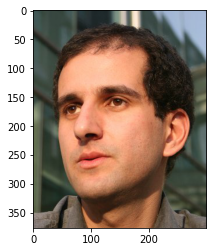

In [218]:
imshow(mahotas.demos.load('luispedro'))

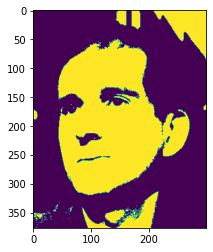

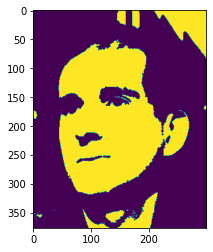

In [216]:
## 16:15
import mahotas
import mahotas.demos
from pylab import gray, imshow, show
import numpy as np

luispedro = mahotas.demos.load('luispedro')
luispedro = luispedro.max(2) # 2개의 그룹
T_otsu = mahotas.otsu(luispedro) # otsu 알고리즘 : thresholding 경계선의 문지방
img = luispedro > T_otsu # true/false를 구한다음
imshow(img)
show()
# morph A -> B (모핑)
new_img = mahotas.morph.erode(img) # 경계선을 뚜렷하게
imshow(new_img)
show()

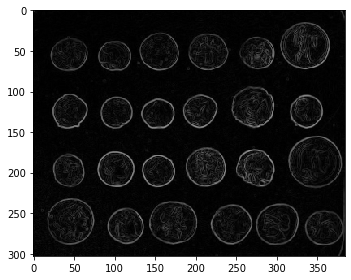

In [219]:
## 16:21
## https://scikit-image.org/
from skimage import data, io, filters
image = data.coins()
edges = filters.sobel(image)
io.imshow(edges)
io.show()

In [220]:
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/test.jpg   -O test.jpg
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml   -O haarcascade_frontalface_default.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_smile.xml  -O haarcascade_smile.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_eye.xml  -O haarcascade_eye.xml
!wget --no-check-certificate \
    https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/utils/common.py   -O common.py

--2022-10-26 07:23:56--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/test.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 240458 (235K) [image/jpeg]
Saving to: ‘test.jpg’

test.jpg            100%[===================>] 234.82K  --.-KB/s    in 0.03s   

2022-10-26 07:23:56 (7.25 MB/s) - ‘test.jpg’ saved [240458/240458]

--2022-10-26 07:23:56--  https://raw.githubusercontent.com/computationalcore/introduction-to-opencv/master/assets/haarcascade_frontalface_default.xml
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awai

In [221]:
## 16:30
import cv2
import common
import pylab
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

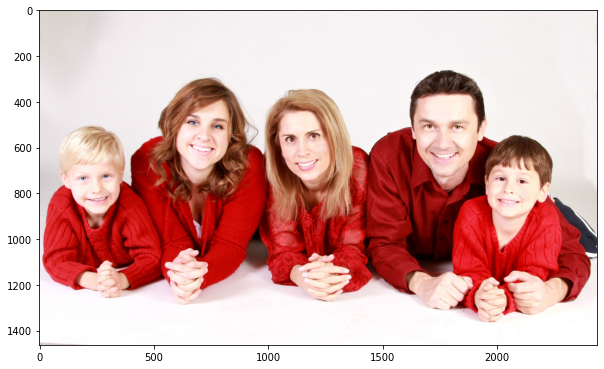

In [225]:
import matplotlib.pyplot as plt
base_image = cv2.imread('/content/family2.jpg')
grey = cv2.cvtColor(base_image, cv2.COLOR_BGR2GRAY)
plt.imshow(cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB))

In [ ]:
## https://sinawi.tistory.com/119

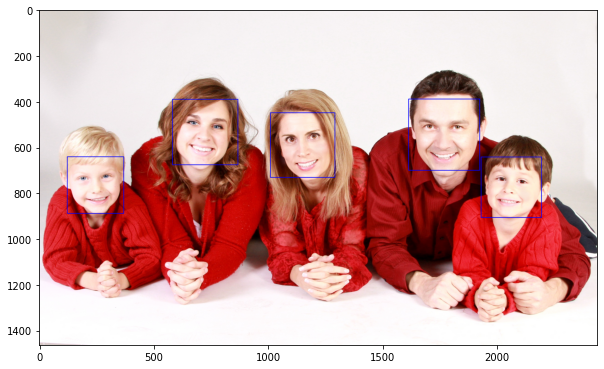

In [228]:
# 특징 파일을 매개변수로 인스턴스
face_cascade = cv2.CascadeClassifier('/content/haarcascade_frontalface_default.xml')
# 반드시 그레이 스케일 이미지
# scaleFactor : 1.3, 최소한 이웃 픽셀
faces = face_cascade.detectMultiScale(grey, 1.3, 5)
# 사각형은 좌상단 우하단점
# 여기서는 좌상단점을 주고, width, height를 준다는 점
for (x,y,w,h) in faces:
  cv2.rectangle(base_image,(x, y),(x+w,y+h),(255,0,0),2)
plt.imshow(cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB))

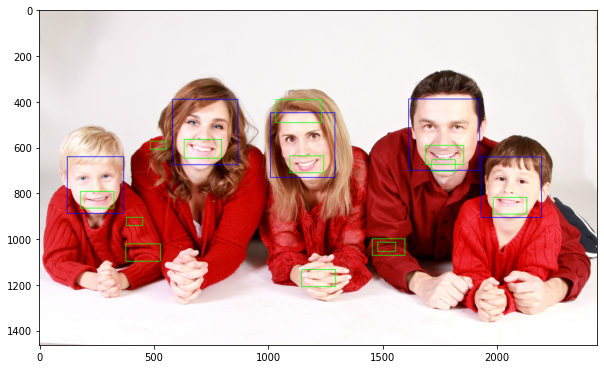

In [229]:
smile_cascade = cv2.CascadeClassifier('haarcascade_smile.xml')
smiles = smile_cascade.detectMultiScale(grey, 1.3, 20)
for (x, y, w, h) in smiles:
  cv2. rectangle(base_image, (x, y),(x+w, y+h), (0, 255, 0), 2)
plt.imshow(cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB))

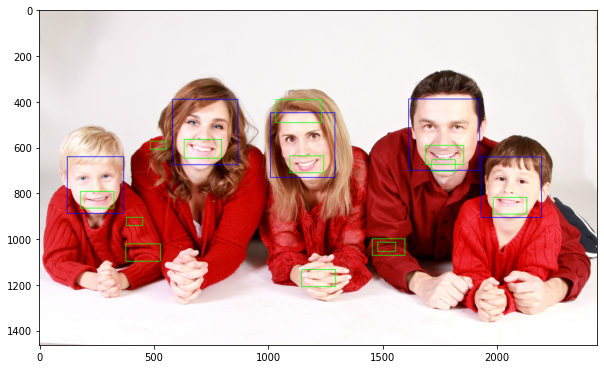

In [231]:
for (x, y, w, h) in faces:
  for (x_s, y_s, w_s, h_s) in smiles:
    if( (x <= x_s) and (y <= y_s) and (x+w >= x_s+ w_s) and (y+h >= y_s+h_s)):
      cv2.rectangle(base_image, (x_s,y_s),(x_s+w_s,y_s+h_s),(0, 255, 0),2)
plt.imshow(cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB))

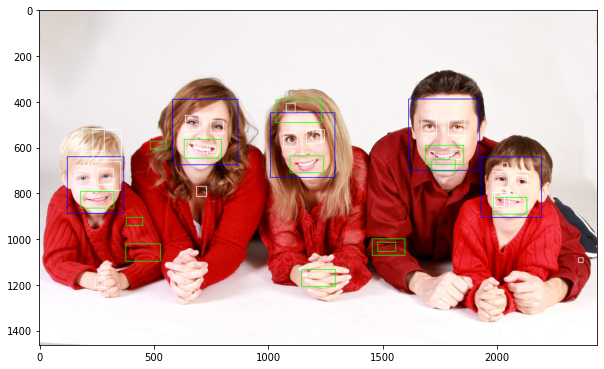

In [232]:
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')
eyes = eye_cascade.detectMultiScale(grey, 1.3, 1)
for (x, y, w, h) in eyes:
  cv2.rectangle(base_image, (x, y),(x+w, y+h),(255, 255, 255),2)
plt.imshow(cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB))

In [ ]:
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')
eyes = eye_cascade.detectMultiScale(grey, 1.3, 1)
for (x, y, w, h) in eyes:
  cv2.rectangle(base_image, (x, y),(x+w, y+h),(255, 255, 255),2)
plt.imshow(cv2.cvtColor(base_image, cv2.COLOR_BGR2RGB))

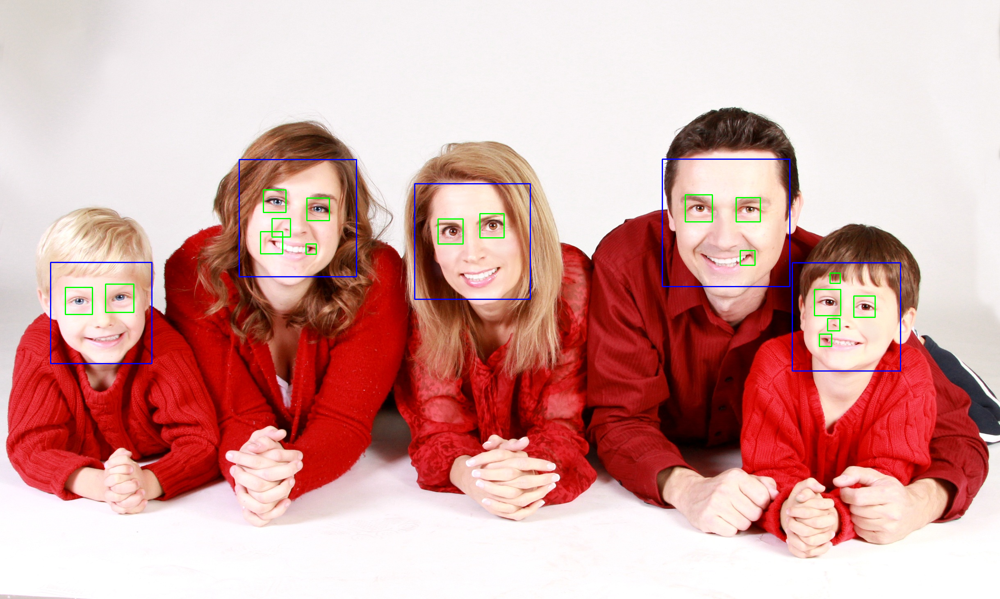

In [238]:
eye_cascade = cv2.CascadeClassifier('haarcascade_eye.xml')

img = cv2.imread('/content/family2.jpg')
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(gray, 1.3, 5)


for (x,y,w,h) in faces:
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]
    eyes = eye_cascade.detectMultiScale(roi_gray)
    for (ex,ey,ew,eh) in eyes:
        cv2.rectangle(roi_color,(ex,ey),(ex+ew,ey+eh),(0,255,0),2)

cv2_imshow(img)


In [237]:
## -*- coding: utf-8 -*-  # 한글 주석쓸려면 적기
 
import cv2
 
font = cv2.FONT_ITALIC
 
def faceDetect():
    eye_detect = False
    face_cascade = cv2.CascadeClassifier("./haarcascade_frontalface_default.xml")  # 얼굴찾기 haar 파일
    eye_cascade = cv2.CascadeClassifier("./haarcascade_eye.xml") # 눈찾기 haar 파일
 
    try:
        cam = cv2.VideoCapture(0)
    except:
        print("camera loading error")
        return
 
    while True:
        ret, frame = cam.read()
        if not ret:
            break
 
        if eye_detect:
            info = "Eye Detention ON"
        else:
            info = "Eye Detection OFF"
 
        gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
        faces = face_cascade.detectMultiScale(gray,1.3, 5)
 
        faces = face_cascade.detectMultiScale(gray, 1.3, 5)
 
        #카메라 영상 왼쪽위에 위에 셋팅된 info 의 내용 출력
        cv2.putText(frame, info, (5,15), font, 0.5, (255,0, 255),1)
 
        for(x,y, w,h) in faces:
            cv2.rectangle(frame, (x,y), (x+w, y+h), (255,0,0), 2)  #사각형 범위
            cv2.putText(frame, "Detected Face", (x-5, y-5), font, 0.5, (255,255,0),2)  #얼굴찾았다는 메시지
            if eye_detect:  #눈찾기
                roi_gray = gray[y:y+h, x:x+w]
                roi_color = frame[y:y+h, x:x+w]
                eyes = eye_cascade.detectMultiScale(roi_gray)
                for (ex,ey,ew,eh) in eyes:
                    cv2.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0,255,0), 2)
 
        cv2.imshow("frame", frame)
        k=cv2.waitKey(30)
 
        #실행 중 키보드 i 를 누르면 눈찾기를 on, off한다.
        if k == ord('i'):
            eye_detect = not eye_detect
        if k == 27:
            break
    cam.release()
    cv2.destroyAllWindows()
 
faceDetect()

# 이미지처리